In [ ]:
import pandas as pd
from google.colab import drive
import numpy as np
import random
import matplotlib.pyplot as plt
import torch
import os
import tensorflow as tf
import keras
import time
import pickle
from keras.layers import Input, Conv2D, Lambda, merge, Dense, Flatten,MaxPooling2D,Dropout
from keras.models import Model, Sequential
from keras.regularizers import l2
from sklearn.model_selection import train_test_split
from keras import backend as K
from keras.optimizers import SGD,Adam
from keras.losses import binary_crossentropy
import matplotlib.pyplot as plt
import matplotlib
import math
import h5py
import string
from tensorflow.python.framework import ops
import string
from sklearn.utils import shuffle
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
%matplotlib inline
from math import sin, cos, pi
import cv2

from tqdm.notebook import tqdm

from keras.layers.advanced_activations import LeakyReLU
from keras.models import Sequential, Model, load_model
from keras.layers import Activation, Convolution2D, MaxPooling2D, BatchNormalization, Flatten, Dense, Dropout, Conv2D,MaxPool2D, ZeroPadding2D
from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
from keras.optimizers import Adam

In [ ]:
drive.mount('/content/drive/',force_remount=True)

Mounted at /content/drive/


In [ ]:
!ls "/content/drive/My Drive/FaceRec/facial-keypoints-detection"

best_model.hdf5     data2	       keras.hdf5    SampleSubmission.csv
best_model_v2.hdf5  fatih	       my_model.pkl  test.csv
best_model_v3.hdf5  fatihData	       res.jpg	     training.csv
data		    IdLookupTable.csv  res.png


In [ ]:
%cd "/content/drive/My Drive/FaceRec/facial-keypoints-detection"

/content/drive/My Drive/FaceRec/facial-keypoints-detection


In [ ]:
train_file = 'training.csv'
test_file = 'test.csv'
df_Train = pd.read_csv(train_file)
df_Test = pd.read_csv(test_file)

In [ ]:
def plot_sample(image, keypoint, axis, title):
    image = image.reshape(96,96)
    axis.imshow(image, cmap='gray')
    axis.scatter(keypoint[0::2], keypoint[1::2], marker='x', s=20)
    plt.title(title)

In [ ]:
train_data = df_Train.dropna()
print("train_data shape: {}".format(np.shape(train_data)))
test_data = df_Test

train_data shape: (2140, 31)


In [ ]:
random.seed(42)
sample_image_index = random.randint(1,100)    


Shape of train_images: (2140, 96, 96, 1)
Shape of train_keypoints: (2140, 30)
Shape of test_images: (1783, 96, 96, 1)


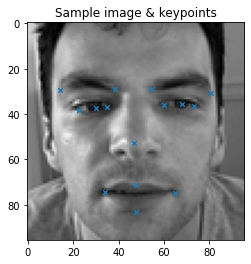

In [ ]:
def load_images(image_data):
    images = []
    for idx, sample in image_data.iterrows():
        pixel = np.array(sample['Image'].split(' '), dtype=int)
        pixel = np.reshape(pixel, (96,96,1))
        images.append(pixel)
    images = np.array(images)/255.
    return images

def load_keypoints(keypoint_data):
    keypoint_data = keypoint_data.drop('Image',axis = 1)
    keypoint_features = []
    for idx, keypoints in keypoint_data.iterrows():
        keypoint_features.append(keypoints)
    keypoint_features = np.array(keypoint_features, dtype = 'float')
    return keypoint_features

train_images = load_images(train_data)
print("Shape of train_images: {}".format(np.shape(train_images)))
train_keypoints = load_keypoints(train_data)
print("Shape of train_keypoints: {}".format(np.shape(train_keypoints)))
test_images = load_images(test_data)
print("Shape of test_images: {}".format(np.shape(test_images)))

fig, axis = plt.subplots()
plot_sample(train_images[sample_image_index], train_keypoints[sample_image_index], axis, "Sample image & keypoints")
   

Shape of flipped_train_images: (2140, 96, 96, 1)
Shape of flipped_train_keypoints: (2140, 30)
After the flipped_train_images: (4280, 96, 96, 1)


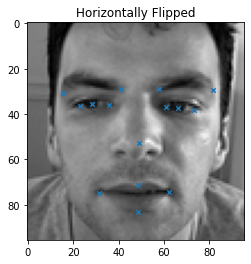

In [ ]:
def left_right_flip(images, keypoints):
    flipped_keypoints = []
    flipped_images = np.flip(images, axis=2)   
    for idx, sample_keypoints in enumerate(keypoints):
        flipped_keypoints.append([96.-coor if idx%2==0 else coor for idx,coor in enumerate(sample_keypoints)])    # Subtract only X coordinates of keypoints from 96 for horizontal flipping
    return flipped_images, flipped_keypoints


flipped_train_images, flipped_train_keypoints = left_right_flip(train_images, train_keypoints)
print("Shape of flipped_train_images: {}".format(np.shape(flipped_train_images)))
print("Shape of flipped_train_keypoints: {}".format(np.shape(flipped_train_keypoints)))
train_images = np.concatenate((train_images, flipped_train_images))
train_keypoints = np.concatenate((train_keypoints, flipped_train_keypoints))
print("After the flipped_train_images: {}".format(np.shape(train_images)))
fig, axis = plt.subplots()
plot_sample(flipped_train_images[sample_image_index], flipped_train_keypoints[sample_image_index], axis, "Horizontally Flipped") 

Augmenting for angles (in degrees): 
12  -12  
Shape of rotated_train_images: (8560, 96, 96, 1)
Shape of rotated_train_keypoints: (8560, 30)

After the rotated_train_keypoints: (12840, 30)



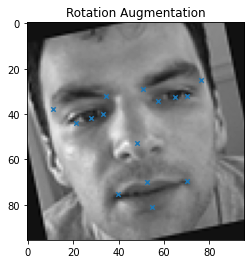

In [ ]:
rotation_angles = [12]
def rotate_augmentation(images, keypoints):
    rotated_images = []
    rotated_keypoints = []
    print("Augmenting for angles (in degrees): ")
    for angle in rotation_angles:    
        for angle in [angle,-angle]:
            print(f'{angle}', end='  ')
            M = cv2.getRotationMatrix2D((48,48), angle, 1.0)
            angle_rad = -angle*pi/180.   
            # For train_images
            for image in images:
                rotated_image = cv2.warpAffine(image, M, (96,96), flags=cv2.INTER_CUBIC)
                rotated_images.append(rotated_image)
            # For train_keypoints
            for keypoint in keypoints:
                rotated_keypoint = keypoint - 48.    # Subtract the middle value of the image dimension
                for idx in range(0,len(rotated_keypoint),2):
                    # https://in.mathworks.com/matlabcentral/answers/93554-how-can-i-rotate-a-set-of-points-in-a-plane-by-a-certain-angle-about-an-arbitrary-point
                    rotated_keypoint[idx] = rotated_keypoint[idx]*cos(angle_rad)-rotated_keypoint[idx+1]*sin(angle_rad)
                    rotated_keypoint[idx+1] = rotated_keypoint[idx]*sin(angle_rad)+rotated_keypoint[idx+1]*cos(angle_rad)
                rotated_keypoint += 48.   # Add the earlier subtracted value
                rotated_keypoints.append(rotated_keypoint)
            
    return np.reshape(rotated_images,(-1,96,96,1)), rotated_keypoints


rotated_train_images, rotated_train_keypoints = rotate_augmentation(train_images, train_keypoints)
print("\nShape of rotated_train_images: {}".format(np.shape(rotated_train_images)))
print("Shape of rotated_train_keypoints: {}\n".format(np.shape(rotated_train_keypoints)))
train_images = np.concatenate((train_images, rotated_train_images))
train_keypoints = np.concatenate((train_keypoints, rotated_train_keypoints))
print("After the rotated_train_keypoints: {}\n".format(np.shape(train_keypoints)))
fig, axis = plt.subplots()
plot_sample(rotated_train_images[sample_image_index], rotated_train_keypoints[sample_image_index], axis, "Rotation Augmentation")

Shape of altered_brightness_train_images: (25680, 96, 96, 1)
Shape of altered_brightness_train_keypoints: (25680, 30)
After the altered_brightness_train_images: (38520, 96, 96, 1)


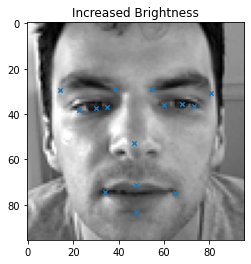

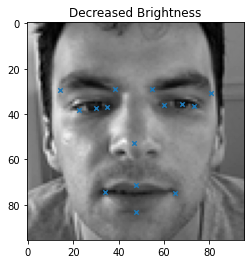

In [ ]:
def alter_brightness(images, keypoints):
    altered_brightness_images = []
    inc_brightness_images = np.clip(images*1.2, 0.0, 1.0)    # Increased brightness by a factor of 1.2 & clip any values outside the range of [-1,1]
    dec_brightness_images = np.clip(images*0.5, 0.0, 1.0)    # Decreased brightness by a factor of 0.6 & clip any values outside the range of [-1,1]
    altered_brightness_images.extend(inc_brightness_images)
    altered_brightness_images.extend(dec_brightness_images)
    return altered_brightness_images, np.concatenate((keypoints, keypoints))


altered_brightness_train_images, altered_brightness_train_keypoints = alter_brightness(train_images, train_keypoints)
print(f"Shape of altered_brightness_train_images: {np.shape(altered_brightness_train_images)}")
print(f"Shape of altered_brightness_train_keypoints: {np.shape(altered_brightness_train_keypoints)}")
train_images = np.concatenate((train_images, altered_brightness_train_images))
train_keypoints = np.concatenate((train_keypoints, altered_brightness_train_keypoints))
print(f"After the altered_brightness_train_images: {np.shape(train_images)}")
fig, axis = plt.subplots()
plot_sample(altered_brightness_train_images[sample_image_index], altered_brightness_train_keypoints[sample_image_index], axis, "Increased Brightness") 
fig, axis = plt.subplots()
plot_sample(altered_brightness_train_images[len(altered_brightness_train_images)//2+sample_image_index], altered_brightness_train_keypoints[len(altered_brightness_train_images)//2+sample_image_index], axis, "Decreased Brightness") 

Shape of final train_images: (38520, 96, 96, 1)
Shape of final train_keypoints: (38520, 30)

 Clean Train Data: 


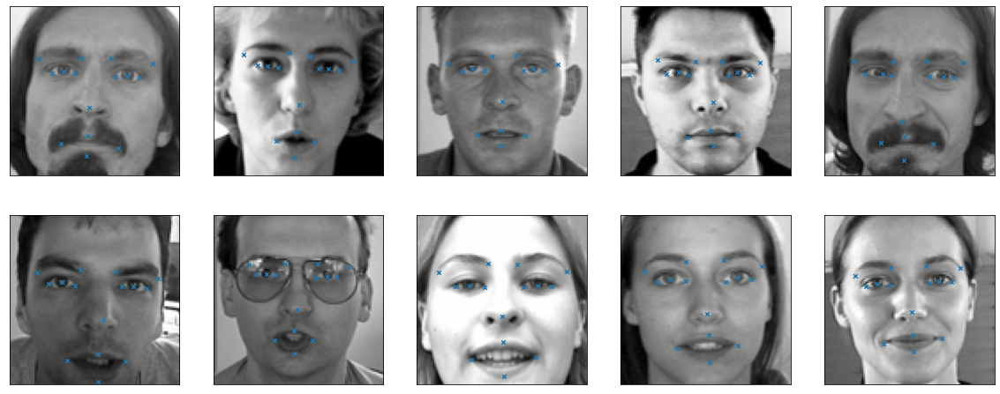

Horizontal Flip Augmentation: 


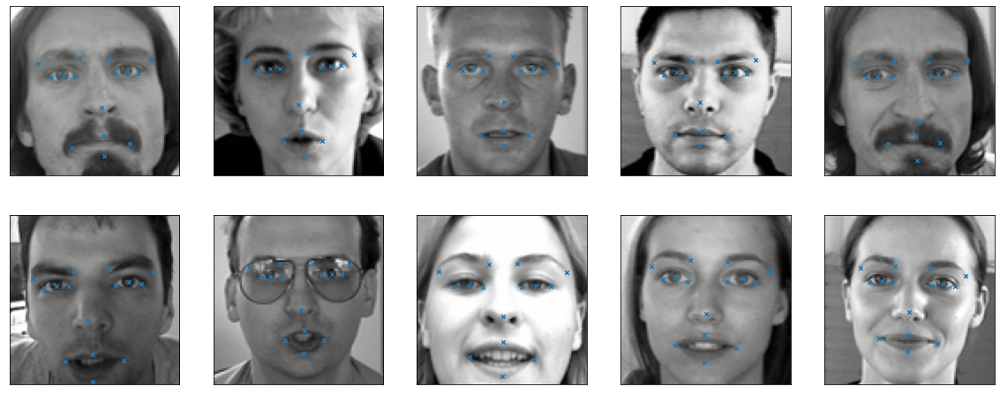

Rotation Augmentation: 


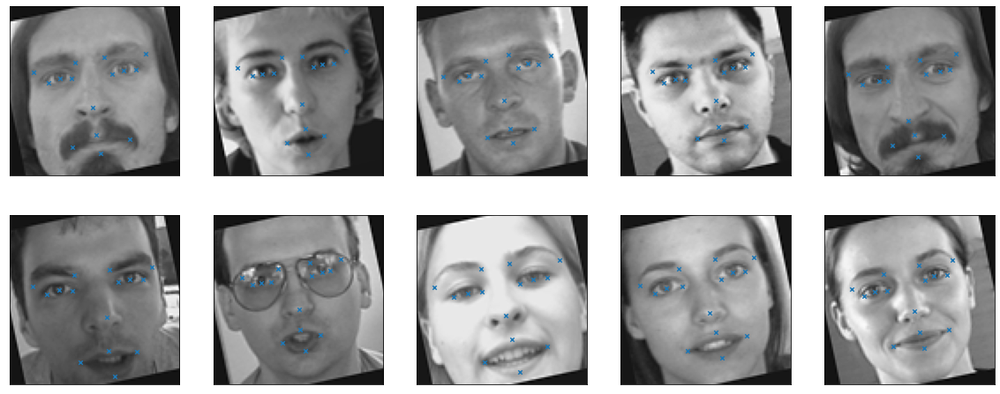

Brightness Augmentation: 


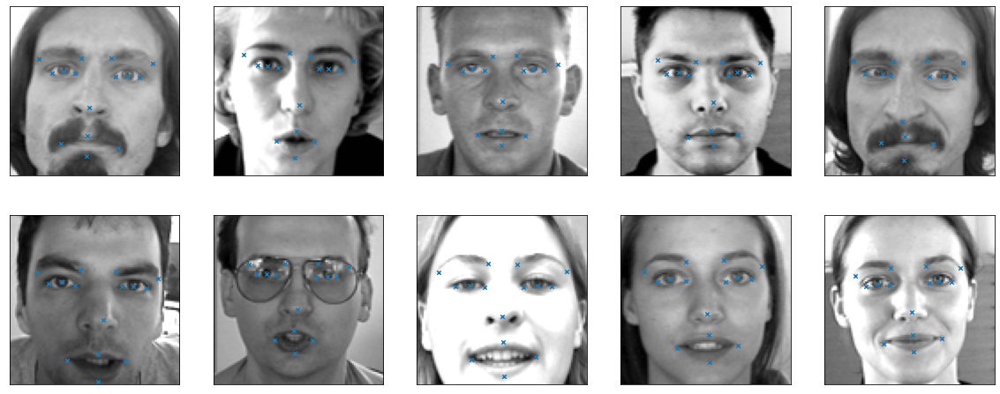

In [ ]:
print("Shape of final train_images: {}".format(np.shape(train_images)))
print("Shape of final train_keypoints: {}".format(np.shape(train_keypoints)))

print("\n Clean Train Data: ")
fig = plt.figure(figsize=(20,8))
for i in range(10):
    axis = fig.add_subplot(2, 5, i+1, xticks=[], yticks=[])
    plot_sample(train_images[i], train_keypoints[i], axis, "")
plt.show()


print("Horizontal Flip Augmentation: ")
fig = plt.figure(figsize=(20,8))
for i in range(10):
    axis = fig.add_subplot(2, 5, i+1, xticks=[], yticks=[])
    plot_sample(flipped_train_images[i], flipped_train_keypoints[i], axis, "")
plt.show()


print("Rotation Augmentation: ")
fig = plt.figure(figsize=(20,8))
for i in range(10):
    axis = fig.add_subplot(2, 5, i+1, xticks=[], yticks=[])
    plot_sample(rotated_train_images[i], rotated_train_keypoints[i], axis, "")
plt.show()
    

print("Brightness Augmentation: ")
fig = plt.figure(figsize=(20,8))
for i in range(10):
    axis = fig.add_subplot(2, 5, i+1, xticks=[], yticks=[])
    plot_sample(altered_brightness_train_images[i], altered_brightness_train_keypoints[i], axis, "")
plt.show()



In [ ]:
model = Sequential()

# Input dimensions: (None, 96, 96, 1)
model.add(Convolution2D(32, (3,3), padding='same', use_bias=False, input_shape=(96,96,1)))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())
# Input dimensions: (None, 96, 96, 32)
model.add(Convolution2D(32, (3,3), padding='same', use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))

# Input dimensions: (None, 48, 48, 32)
model.add(Convolution2D(64, (3,3), padding='same', use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())
# Input dimensions: (None, 48, 48, 64)
model.add(Convolution2D(64, (3,3), padding='same', use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))

# Input dimensions: (None, 24, 24, 64)
model.add(Convolution2D(96, (3,3), padding='same', use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())
# Input dimensions: (None, 24, 24, 96)
model.add(Convolution2D(96, (3,3), padding='same', use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))

# Input dimensions: (None, 12, 12, 96)
model.add(Convolution2D(128, (3,3),padding='same', use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())
# Input dimensions: (None, 12, 12, 128)
model.add(Convolution2D(128, (3,3),padding='same', use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))

# Input dimensions: (None, 6, 6, 128)
model.add(Convolution2D(256, (3,3),padding='same',use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())
# Input dimensions: (None, 6, 6, 256)
model.add(Convolution2D(256, (3,3),padding='same',use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))

# Input dimensions: (None, 3, 3, 256)
model.add(Convolution2D(512, (3,3), padding='same', use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())
# Input dimensions: (None, 3, 3, 512)
model.add(Convolution2D(512, (3,3), padding='same', use_bias=False))
model.add(LeakyReLU(alpha = 0.1))
model.add(BatchNormalization())

# Input dimensions: (None, 3, 3, 512)
model.add(Flatten())
model.add(Dense(512,activation='relu'))
model.add(Dropout(0.1))
model.add(Dense(30))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 96, 96, 32)        288       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 96, 96, 32)        0         
_________________________________________________________________
batch_normalization (BatchNo (None, 96, 96, 32)        128       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 96, 96, 32)        9216      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 96, 96, 32)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 96, 96, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 48, 48, 32)        0

In [ ]:
if os.path.exists('best_model_v4.hdf5'):
    model = load_model('best_model_v4.hdf5')

# Define necessary callbacks
checkpointer = ModelCheckpoint(filepath = 'best_model_v4.hdf5', monitor='val_mae', verbose=1, save_best_only=True, mode='min')

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'acc'])

# Train the model
history = model.fit(train_images, train_keypoints, epochs=100, batch_size=64, validation_split=0.10, callbacks=[checkpointer])

Epoch 1/100
542/542 [==============================] - 88s 72ms/step - loss: 211.0489 - mae: 9.4348 - acc: 0.4666 - val_loss: 101.2106 - val_mae: 6.4659 - val_acc: 0.2435

Epoch 00001: val_mae improved from inf to 6.46592, saving model to best_model_v4.hdf5
Epoch 2/100
542/542 [==============================] - 38s 70ms/step - loss: 53.4254 - mae: 4.3833 - acc: 0.5888 - val_loss: 58.0340 - val_mae: 4.2604 - val_acc: 0.4239

Epoch 00002: val_mae improved from 6.46592 to 4.26043, saving model to best_model_v4.hdf5
Epoch 3/100
542/542 [==============================] - 37s 69ms/step - loss: 36.9662 - mae: 3.6363 - acc: 0.6446 - val_loss: 46.3682 - val_mae: 3.6840 - val_acc: 0.5127

Epoch 00003: val_mae improved from 4.26043 to 3.68400, saving model to best_model_v4.hdf5
Epoch 4/100
542/542 [==============================] - 37s 69ms/step - loss: 21.8936 - mae: 2.8835 - acc: 0.6785 - val_loss: 18.4068 - val_mae: 2.3175 - val_acc: 0.6931

Epoch 00004: val_mae improved from 3.68400 to 2.3174

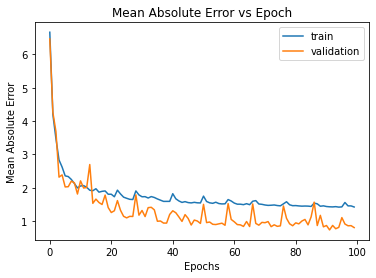

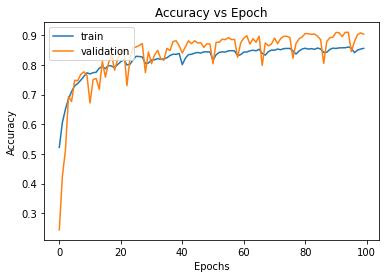

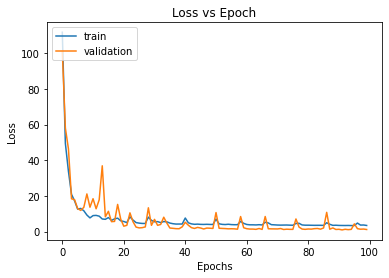

In [ ]:
# summarize history for mean_absolute_error
try:
    plt.plot(history.history['mae'])
    plt.plot(history.history['val_mae'])
    plt.title('Mean Absolute Error vs Epoch')
    plt.ylabel('Mean Absolute Error')
    plt.xlabel('Epochs')
    plt.legend(['train', 'validation'], loc='upper right')
    plt.show()
    # summarize history for accuracy
    plt.plot(history.history['acc'])
    plt.plot(history.history['val_acc'])
    plt.title('Accuracy vs Epoch')
    plt.ylabel('Accuracy')
    plt.xlabel('Epochs')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()
    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Loss vs Epoch')
    plt.ylabel('Loss')
    plt.xlabel('Epochs')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()
except:
    print("One of the metrics used for plotting graphs is missing! See 'model.compile()'s `metrics` argument.")

In [ ]:
model = load_model('best_model_v4.hdf5')
test_preds = model.predict(test_images)

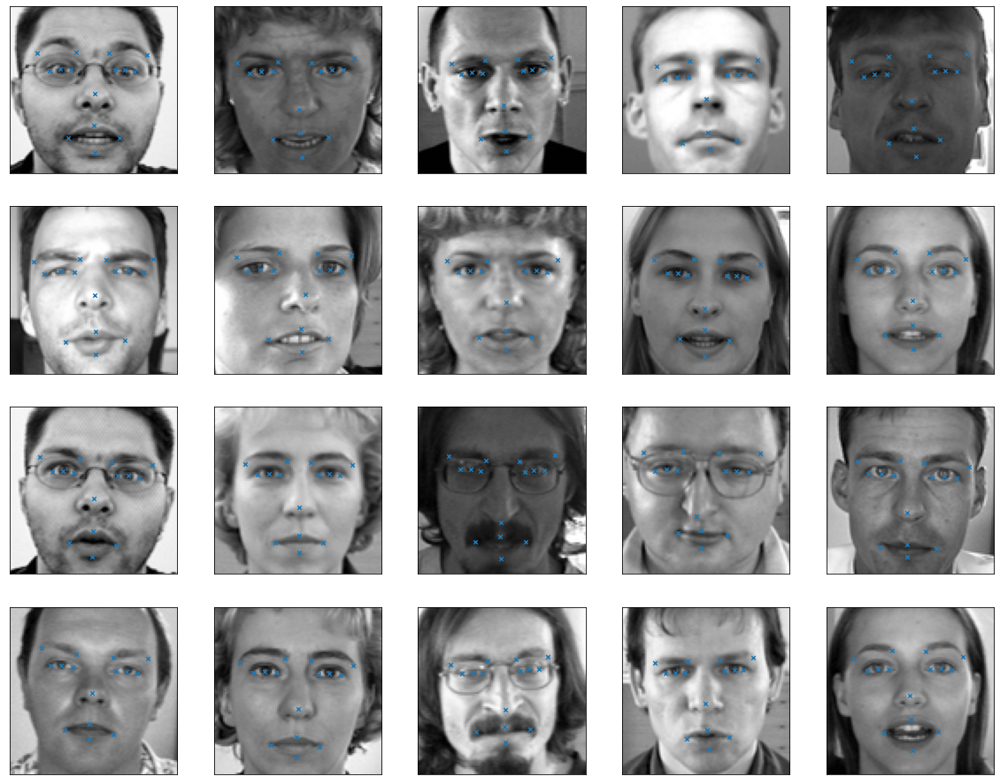

In [ ]:
fig = plt.figure(figsize=(20,16))
for i in range(20):
    axis = fig.add_subplot(4, 5, i+1, xticks=[], yticks=[])
    plot_sample(test_images[i], test_preds[i], axis, "")
plt.show()

In [ ]:
%%time
# Modify ModelCheckpoint callback to save model with best train mae to disk (instead of best validation mae)
checkpointer = ModelCheckpoint(filepath = 'best_model_v4.hdf5', monitor='mae', verbose=1, save_best_only=True, mode='min')
history2 = model.fit(train_images, train_keypoints, epochs=100, batch_size=64, callbacks=[checkpointer])

Epoch 1/100
602/602 [==============================] - 44s 71ms/step - loss: 3.4549 - mae: 1.4311 - acc: 0.8577

Epoch 00001: mae improved from inf to 1.43105, saving model to best_model_v4.hdf5
Epoch 2/100
602/602 [==============================] - 40s 66ms/step - loss: 3.4539 - mae: 1.4301 - acc: 0.8597

Epoch 00002: mae improved from 1.43105 to 1.43011, saving model to best_model_v4.hdf5
Epoch 3/100
602/602 [==============================] - 41s 67ms/step - loss: 3.4086 - mae: 1.4216 - acc: 0.8592

Epoch 00003: mae improved from 1.43011 to 1.42165, saving model to best_model_v4.hdf5
Epoch 4/100
602/602 [==============================] - 40s 67ms/step - loss: 4.5535 - mae: 1.5148 - acc: 0.8446

Epoch 00004: mae did not improve from 1.42165
Epoch 5/100
602/602 [==============================] - 40s 67ms/step - loss: 4.0089 - mae: 1.4987 - acc: 0.8428

Epoch 00005: mae did not improve from 1.42165
Epoch 6/100
602/602 [==============================] - 40s 67ms/step - loss: 3.4541 - mae

In [ ]:
try:
    #plt.plot(history.history2['mae'])
    #plt.plot(history.history2['val_mae'])
    #plt.title('Mean Absolute Error vs Epoch')
    #plt.ylabel('Mean Absolute Error')
    #plt.xlabel('Epochs')
    #plt.legend(['train', 'validation'], loc='upper right')
    #plt.show()
    # summarize history for accuracy
    plt.plot(history.history2['loss'])
    #plt.plot(history.history2['val_acc'])
    plt.title('Accuracy vs Epoch')
    #plt.ylabel('Accuracy')
    #plt.xlabel('Epochs')
    #plt.legend(['train', 'validation'], loc='upper left')
    plt.show()
    # summarize history for loss
    #plt.plot(history.history2['loss'])
    #plt.plot(history.history2['val_loss'])
    #plt.title('Loss vs Epoch')
    #plt.ylabel('Loss')
    #plt.xlabel('Epochs')
    #plt.legend(['train', 'validation'], loc='upper left')
    #plt.show()
except:
    print("One of the metrics used for plotting graphs is missing! See 'model.compile()'s `metrics` argument.")

One of the metrics used for plotting graphs is missing! See 'model.compile()'s `metrics` argument.


In [ ]:
%%time
model = load_model('best_model_v4.hdf5')
test_preds = model.predict(test_images)

CPU times: user 1.7 s, sys: 145 ms, total: 1.85 s
Wall time: 5.53 s


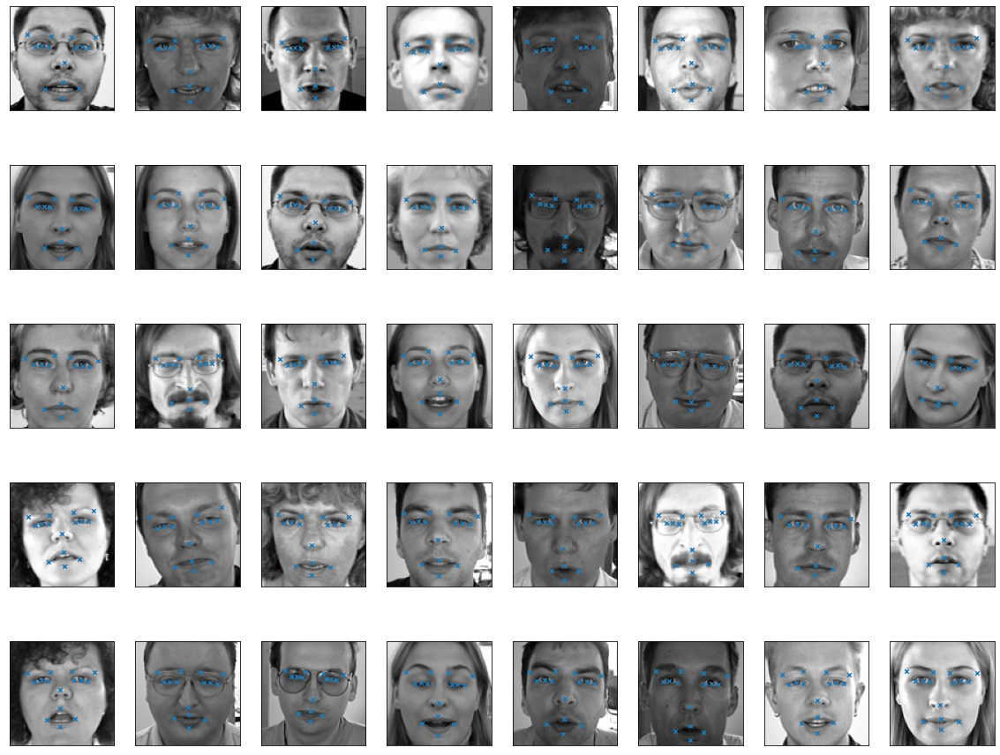

In [ ]:
fig = plt.figure(figsize=(20,16))
for i in range(40):
    axis = fig.add_subplot(5, 8, i+1, xticks=[], yticks=[])
    plot_sample(test_images[i], test_preds[i], axis, "")
plt.show()

In [ ]:
import PIL
print('Pillow Version:', PIL.__version__)

Pillow Version: 7.1.2


In [ ]:
from PIL import Image
test_image = Image.open("data/Velican.2.jpg")
print(test_image.format)
print(test_image.size)
print(test_image.mode)
test_image.show()

JPEG
(200, 200)
L


uint8
(200, 200)


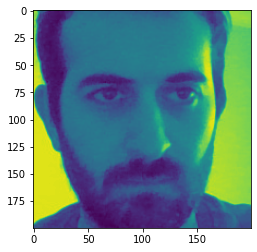

In [ ]:
from matplotlib import image
from matplotlib import pyplot
image = image.imread("data/Velican.80.jpg")
# summarize shape of the pixel array
print(image.dtype)
print(image.shape)
# display the array of pixels as an image
pyplot.imshow(image)
pyplot.show()

In [ ]:
from numpy import asarray
data = asarray(image)
print(type(data))
# summarize shape
print(data.shape)

# create Pillow image
image2 = Image.fromarray(data)
print(type(image2))

# summarize image details
print(image2.mode)
print(image2.size)

<class 'numpy.ndarray'>
(200, 200)
<class 'PIL.Image.Image'>
L
(200, 200)


In [ ]:
path = "data/Velican."
me=[]
for i in range(1,101):
  me.append(np.array(Image.open(path+str(i)+".jpg").resize((96,96))))

In [ ]:
np.shape(me)

(100, 96, 96)

In [ ]:
#++++++++++++++++++++++++++++++++++++++
me=np.reshape(me,(-1,96,96,1))/255.

In [ ]:
np.shape(me)

(100, 96, 96, 1)

In [ ]:
model1_test = load_model("keras.hdf5")
my_preds=model1_test.predict(me)

model2_test = load_model("best_model.hdf5")
my_preds1=model2_test.predict(me)

model3_test = load_model("best_model_v2.hdf5")
my_preds2=model3_test.predict(me)

model4_test = load_model("best_model_v3.hdf5")
my_preds3=model4_test.predict(me)

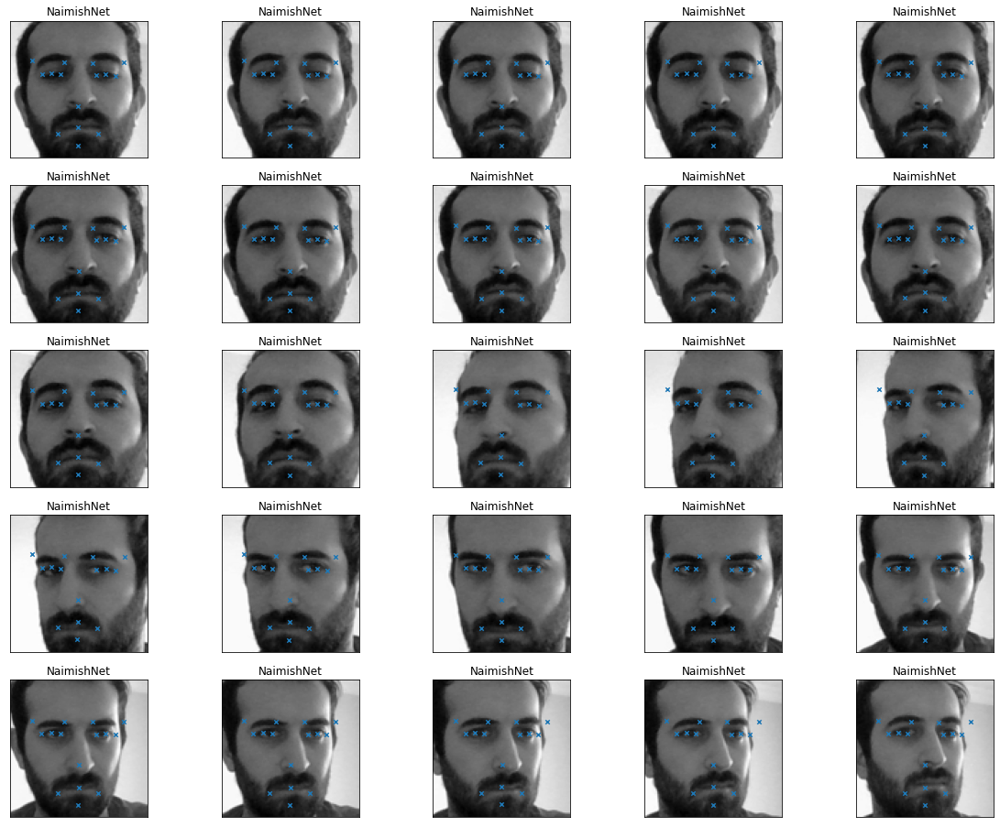

In [ ]:
fig = plt.figure(figsize=(20,16))
for i in range(25):
    axis = fig.add_subplot(5, 5, i+1, xticks=[], yticks=[])
    plot_sample(me[i*4], my_preds[i*4], axis, "NaimishNet")
plt.show()

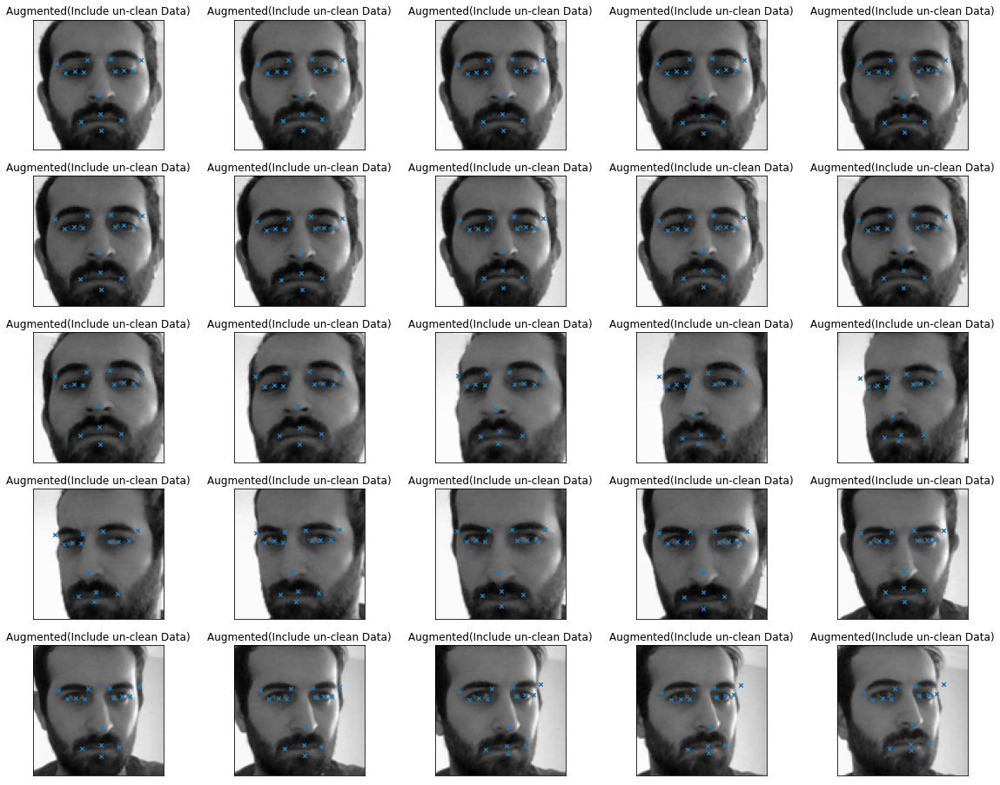

In [ ]:
fig1 = plt.figure(figsize=(20,16))
for i in range(25):
    axis = fig1.add_subplot(5, 5, i+1, xticks=[], yticks=[])
    plot_sample(me[i*4], my_preds1[i*4], axis, "Augmented(Include un-clean Data)")
plt.show()

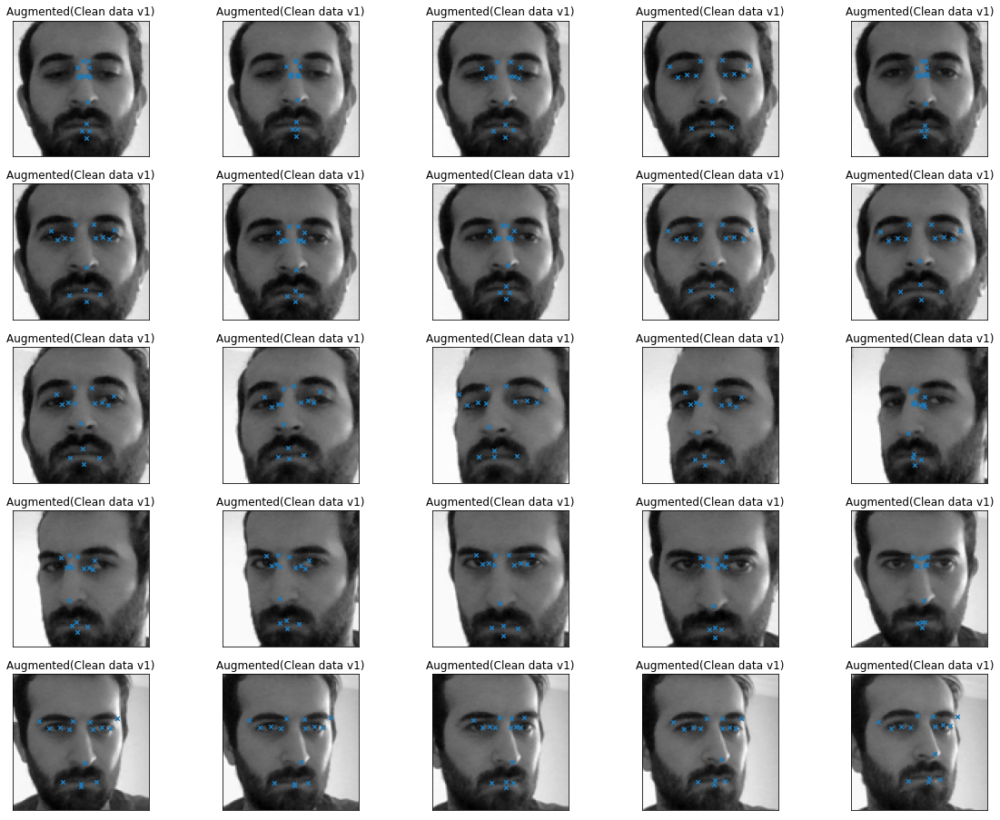

In [ ]:
fig2 = plt.figure(figsize=(20,16))
for i in range(25):
    axis = fig2.add_subplot(5, 5, i+1, xticks=[], yticks=[])
    plot_sample(me[i*4], my_preds2[i*4], axis, "Augmented(Clean data v1)")
plt.show()

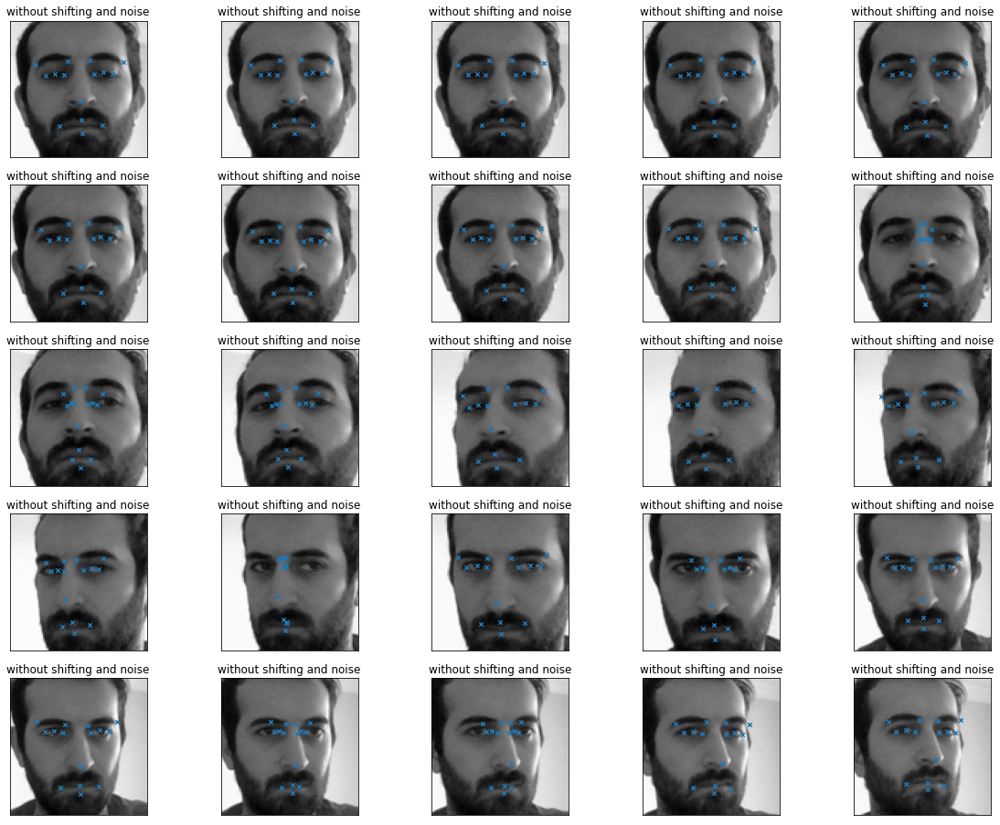

In [ ]:
fig3 = plt.figure(figsize=(20,16))
for i in range(25):
    axis = fig3.add_subplot(5, 5, i+1, xticks=[], yticks=[])
    plot_sample(me[i*4], my_preds3[i*4], axis, "without shifting and noise")
plt.show()

In [ ]:
#Try for new photos of me
path = "data2/Velican."
me=[]
for i in range(1,101):
  me.append(np.array(Image.open(path+str(i)+".jpg").resize((96,96))))


In [ ]:
me=np.reshape(me,(-1,96,96,1))/255.

In [ ]:
%%time
model1_test = load_model("keras.hdf5")
my_preds=model1_test.predict(me)

model2_test = load_model("best_model.hdf5")
my_preds1=model2_test.predict(me)

model3_test = load_model("best_model_v2.hdf5")
my_preds2=model3_test.predict(me)

model4_test = load_model("best_model_v3.hdf5")
my_preds3=model4_test.predict(me)

CPU times: user 10.9 s, sys: 370 ms, total: 11.3 s
Wall time: 7.37 s


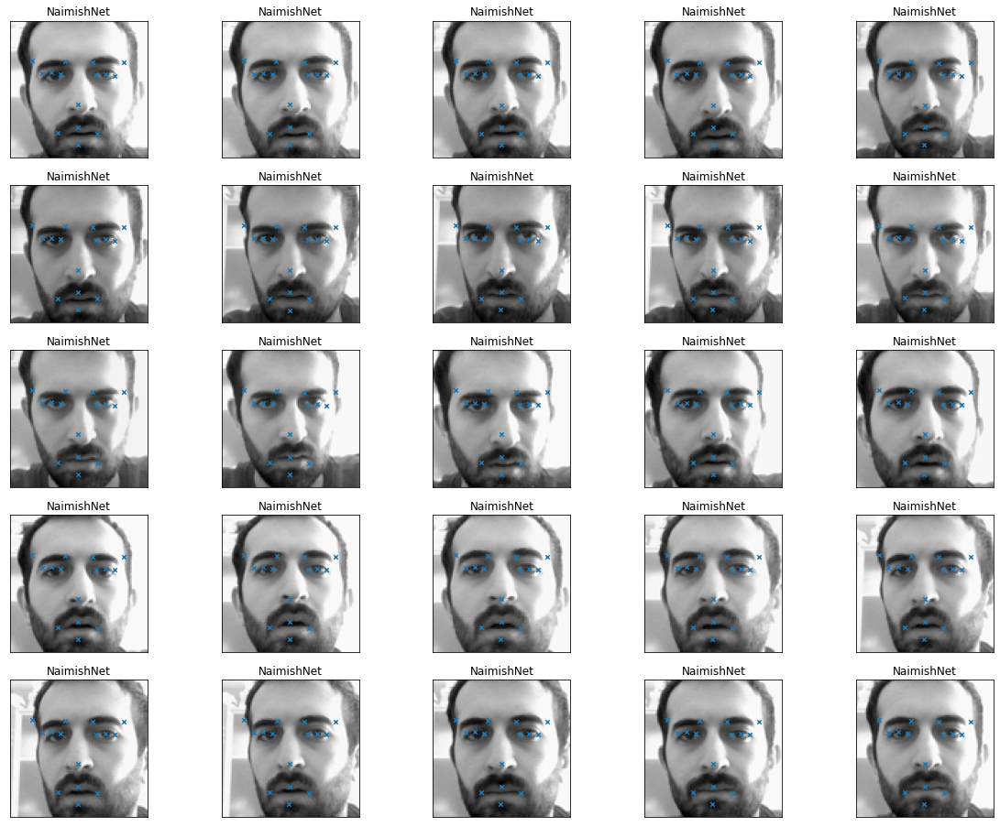

In [ ]:
fig = plt.figure(figsize=(20,16))
for i in range(25):
    axis = fig.add_subplot(5, 5, i+1, xticks=[], yticks=[])
    plot_sample(me[i*4], my_preds[i*4], axis, "NaimishNet")
plt.show()

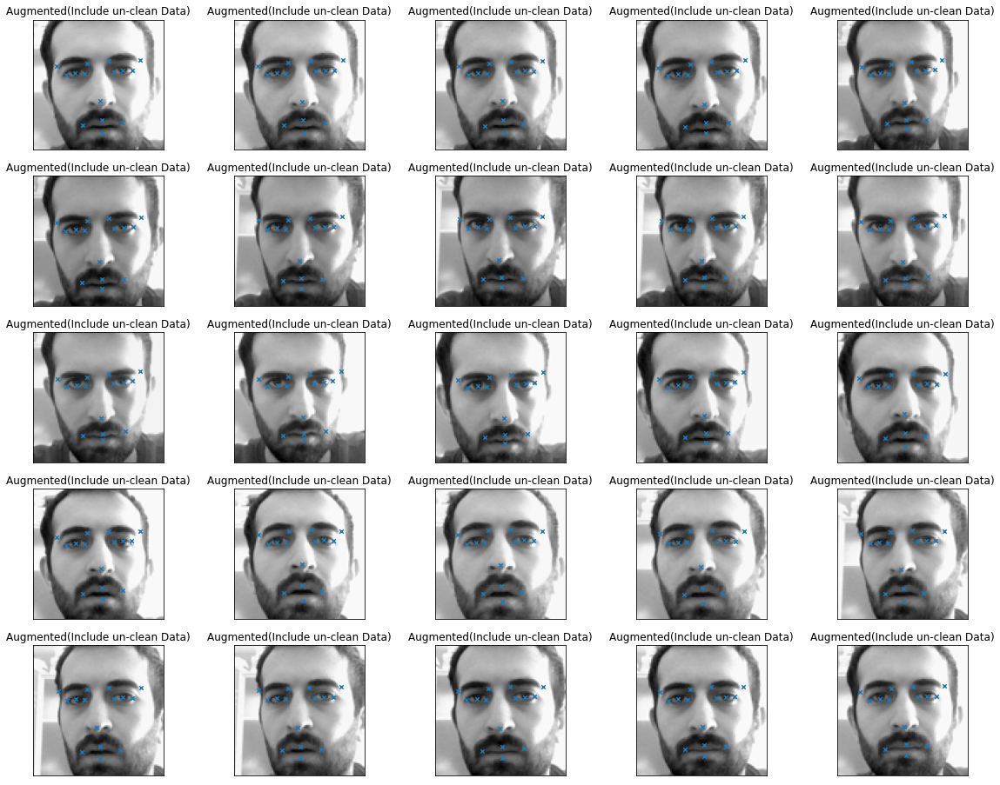

In [ ]:
fig1 = plt.figure(figsize=(20,16))
for i in range(25):
    axis = fig1.add_subplot(5, 5, i+1, xticks=[], yticks=[])
    plot_sample(me[i*4], my_preds1[i*4], axis, "Augmented(Include un-clean Data)")
plt.show()

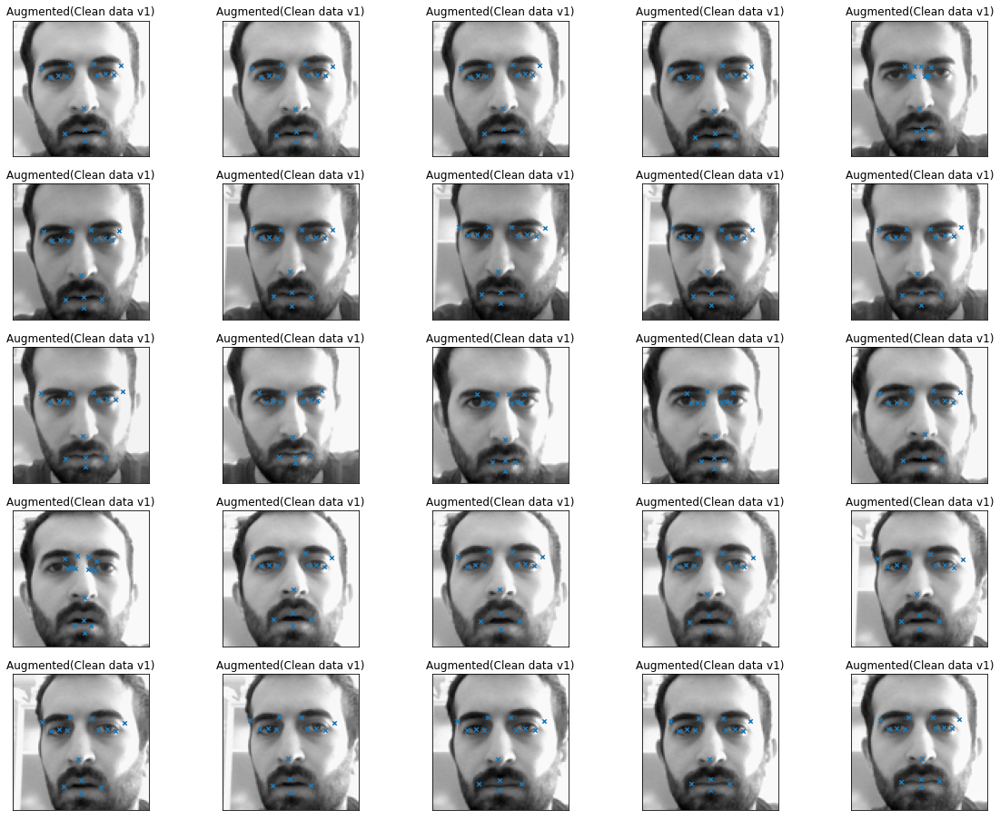

In [ ]:
fig2 = plt.figure(figsize=(20,16))
for i in range(25):
    axis = fig2.add_subplot(5, 5, i+1, xticks=[], yticks=[])
    plot_sample(me[i*4], my_preds2[i*4], axis, "Augmented(Clean data v1)")
plt.show()

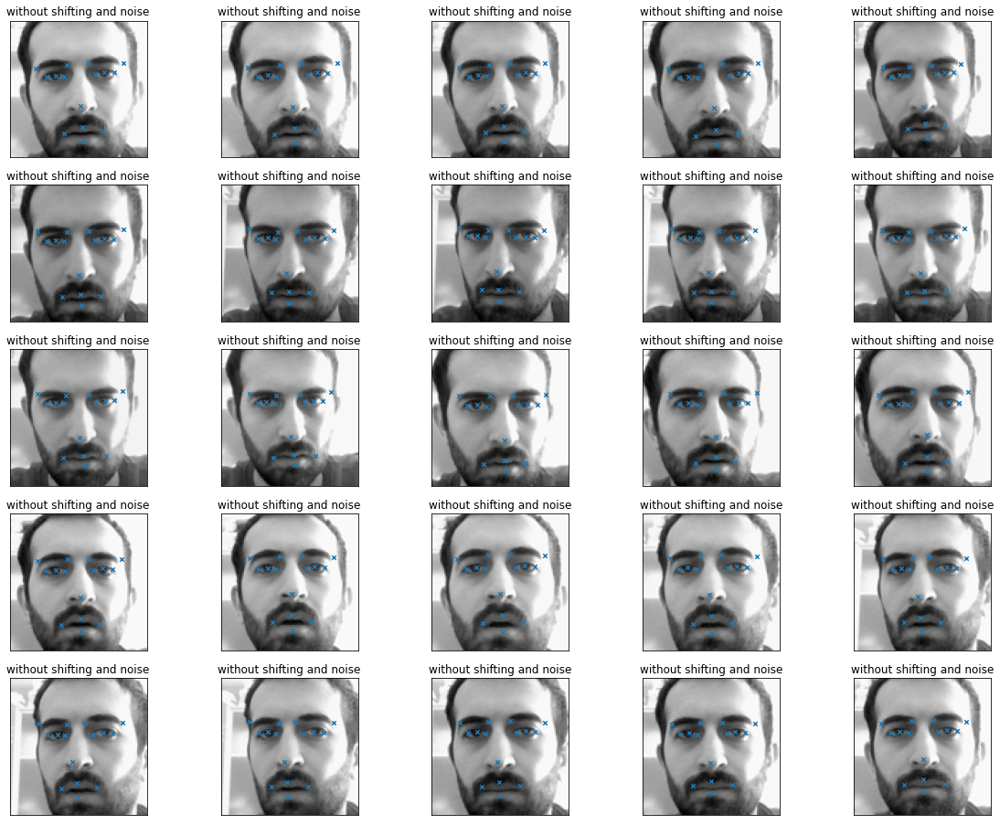

In [ ]:
fig3 = plt.figure(figsize=(20,16))
for i in range(25):
    axis = fig3.add_subplot(5, 5, i+1, xticks=[], yticks=[])
    plot_sample(me[i*4], my_preds3[i*4], axis, "without shifting and noise")
plt.show()

In [ ]:
np.sqrt(np.square(my_preds3[92][2]-my_preds3[92][4])+np.square(my_preds3[92][3]-my_preds3[92][5])),np.sqrt(np.square(my_preds3[96][2]-my_preds3[96][4])+np.square(my_preds3[96][3]-my_preds3[96][5]))

(26.24459, 26.955215)

In [ ]:
#Try for new photos of my bro
path = "fatih/fatih."
bro=[]
for i in range(1,101):
  bro.append(np.array(Image.open(path+str(i)+".jpg").resize((96,96))))

In [ ]:
bro=np.reshape(bro,(-1,96,96,1))/255.

In [ ]:
%%time
model1F_test = load_model("keras.hdf5")
bro_preds=model1F_test.predict(bro)

model2F_test = load_model("best_model.hdf5")
bro_preds1=model2F_test.predict(bro)

model3F_test = load_model("best_model_v2.hdf5")
bro_preds2=model3F_test.predict(bro)

model4F_test = load_model("best_model_v3.hdf5")
bro_preds3=model4F_test.predict(bro)

CPU times: user 10.8 s, sys: 304 ms, total: 11.1 s
Wall time: 7.21 s


In [ ]:
bro_preds3[4][1]-bro_preds3[4][2],bro_preds3[8][1]-bro_preds3[8][2]

(-28.240799, -27.418358)

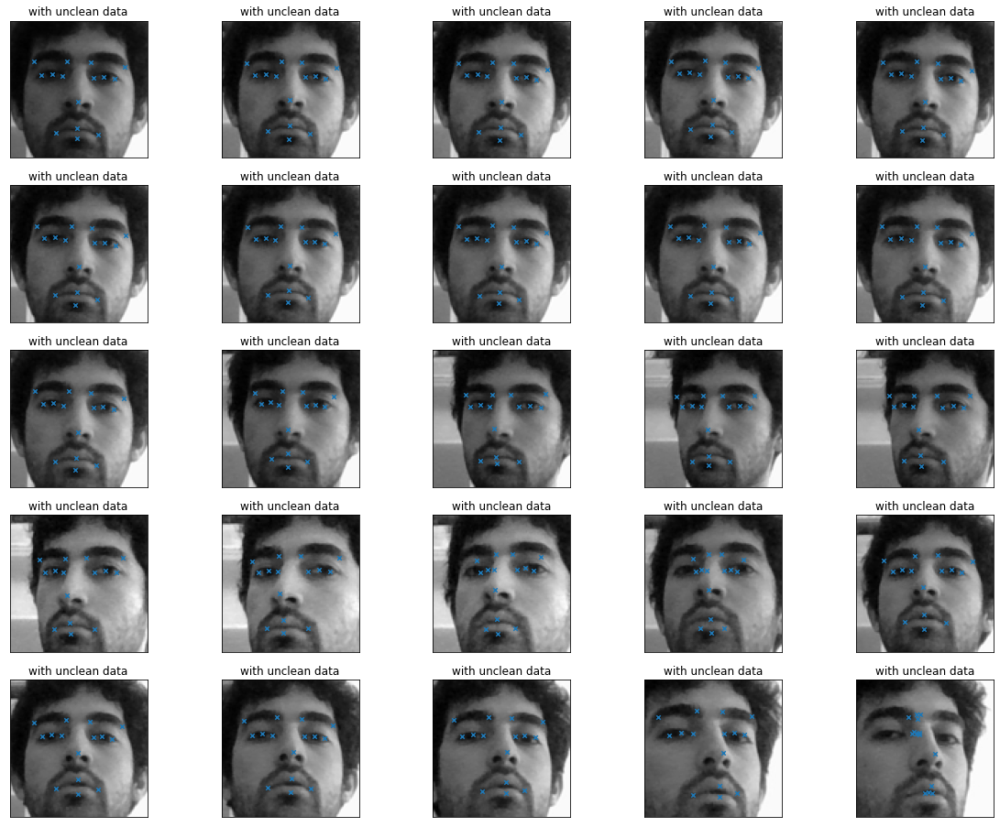

In [ ]:
fig4 = plt.figure(figsize=(20,16))
for i in range(25):
    axis = fig4.add_subplot(5, 5, i+1, xticks=[], yticks=[])
    plot_sample(bro[i*4], bro_preds3[i*4], axis, "with unclean data")
plt.show()

In [ ]:
#Try for new photos of my bro with increased brightness
path = "fatihData/Fatih."
bro=[]
for i in range(1,101):
  bro.append(np.array(Image.open(path+str(i)+".jpg").resize((96,96))))

In [ ]:
bro=np.reshape(bro,(-1,96,96,1))/255.

In [ ]:
%%time
model1F_test = load_model("keras.hdf5")
bro_preds=model1F_test.predict(bro)

model2F_test = load_model("best_model.hdf5")
bro_preds1=model2F_test.predict(bro)

model3F_test = load_model("best_model_v2.hdf5")
bro_preds2=model3F_test.predict(bro)

model4F_test = load_model("best_model_v3.hdf5")
bro_preds3=model4F_test.predict(bro)

CPU times: user 11.4 s, sys: 410 ms, total: 11.8 s
Wall time: 7.72 s


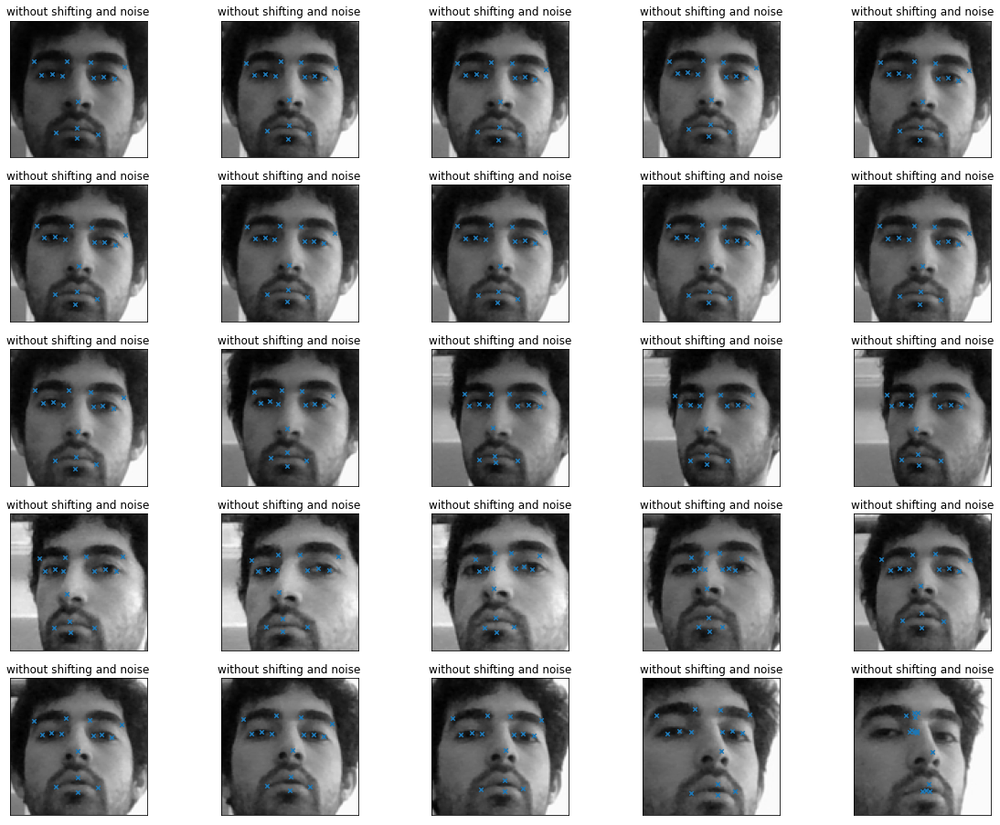

In [ ]:
fig4 = plt.figure(figsize=(20,16))
for i in range(25):
    axis = fig4.add_subplot(5, 5, i+1, xticks=[], yticks=[])
    plot_sample(bro[i*4], bro_preds3[i*4], axis, "without shifting and noise")
plt.show()